# Dao THAUVIN
# Luc STERKERS

# Practical work 4: Frequency filtering, color

In [1]:
import numpy as np
from numpy.fft import fft2,ifft2,fftshift,ifftshift
import matplotlib.pyplot as plt
from PIL import Image
from matplotlib import cm

def imshow(I,title=None,size=500):
    """ display an image with a specific size """
    plt.figure(figsize=(size//80,size//80))
    plt.gray()
    plt.imshow(I)
    if title: plt.title(title)
    plt.show()


## Exercice 1 - Frequency filtering

1. Compute than display the centered module of Fourier transform of `img/mandrill.png` (use functions seen in previous lessons). 

In [2]:
%matplotlib notebook
def surf(Z,title=None):

    X,Y = np.meshgrid(range(Z.shape[1]), range(Z.shape[0]))
    fig = plt.figure(figsize=(600/80,600/80))
    if title: plt.title(title)
    ax = fig.gca(projection='3d')
    ax.plot_surface(X, Y, Z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
    plt.show()


<IPython.core.display.Javascript object>


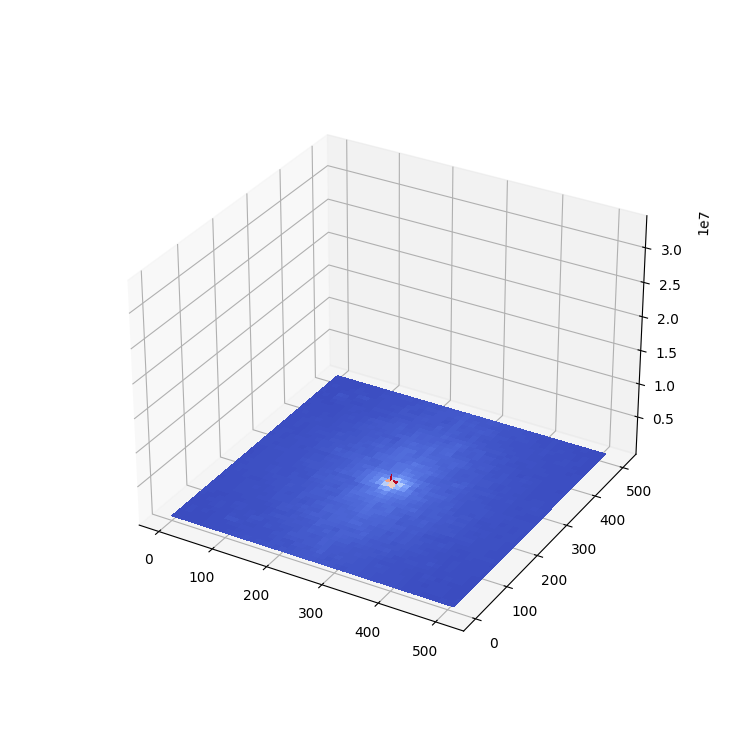

In [6]:
img = Image.open("img/mandrill.png")
surf(np.abs(fftshift(fft2(img))))


2. Write a function `idealLowPassFilter(n,m,fc)` returning an ideal low pass filter with frequency cutoff $f_c$ and size $n\times m$. Recall: this function set to 1 pixels at Euclidian distance $f_c$ from the center (null frequency).

In [3]:
def idealLowPassFilter(n,m,fc):
    return [[1 if 
             fc >= np.sqrt((x-((n//2)))**2+(y-((m//2)))**2) else 0 
             for x in range(n)] for y in range(m)]

idealLowPassFilter(3,3,1)

[[0, 1, 0], [1, 1, 1], [0, 1, 0]]

3. Write a function `lowPass(I,fc)` performing a low pass filtering of an image $I$. The function should
 - compute the centered Fourier transform of $I$
 - multiply point-by-point the spectrum with the ideal low filter produced by `idealLowPassFilter()`
 - uncenter the filtered spectrum and apply the inverse Fourier transform (function `ifft2()` from module `numpy.fft`
 - return the real part of filtered image

In [4]:
def lowPass(I,fc):
    FT = fftshift(fft2(I))
    FT = FT * idealLowPassFilter(FT.shape[0],FT.shape[1],fc)
    I2 = ifft2(ifftshift(FT))
    return np.real(I2)

4. Experiment this function on `img/mandrill.png` and `img/lena.jpg` with various values of cut off $f_c$.
 - give two effects that appears when $f_c$ decreases,
 - propose two applications of this filtering.


images de base


<IPython.core.display.Javascript object>


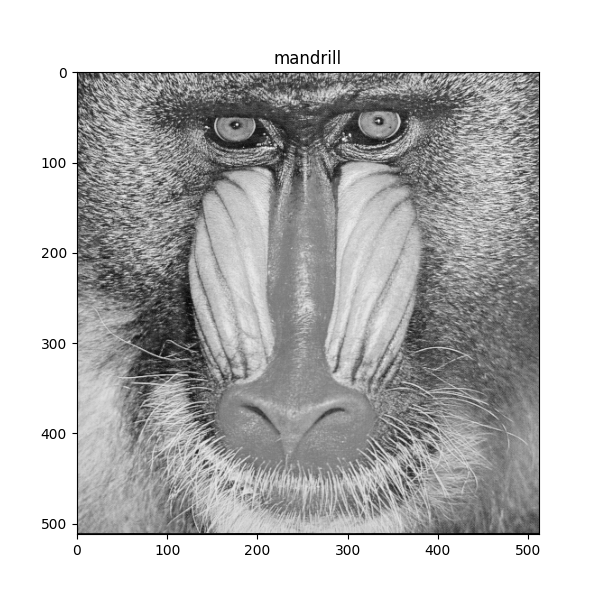

<IPython.core.display.Javascript object>


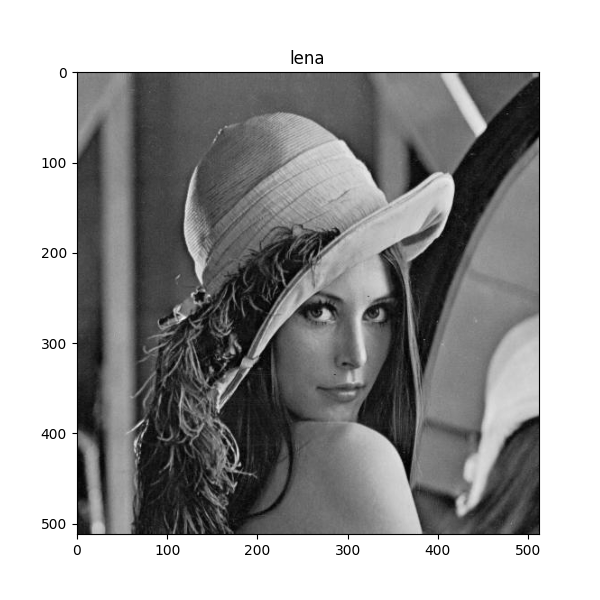

filtré avec fc=1


<IPython.core.display.Javascript object>


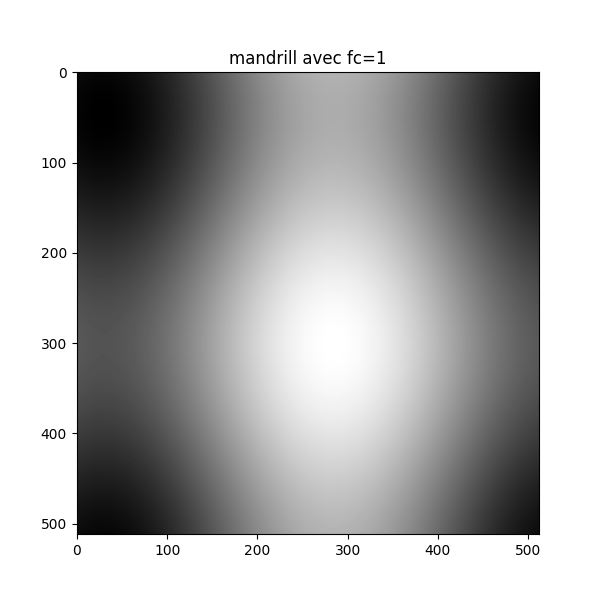

<IPython.core.display.Javascript object>


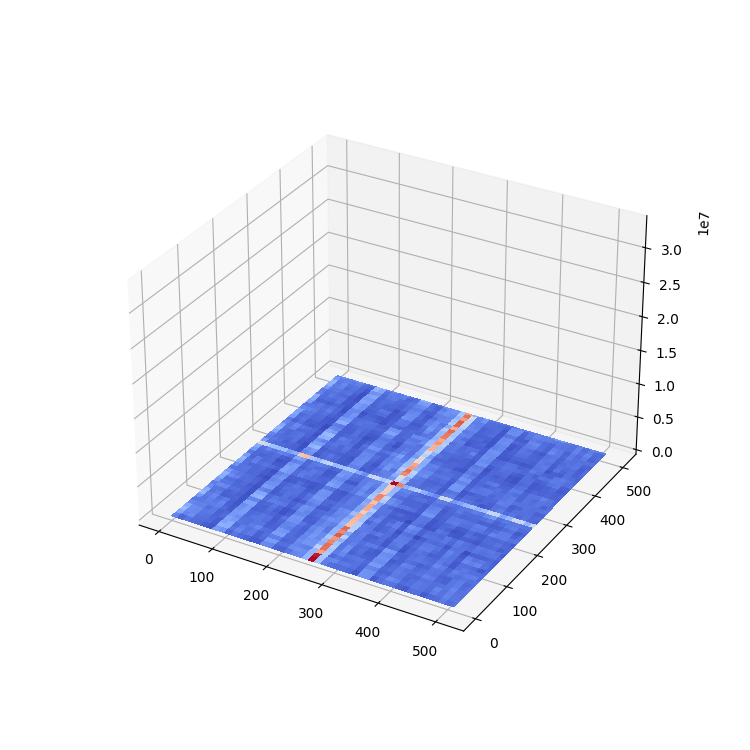

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: Requested projection is different from current axis projection, creating new axis with requested projection.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys


<IPython.core.display.Javascript object>


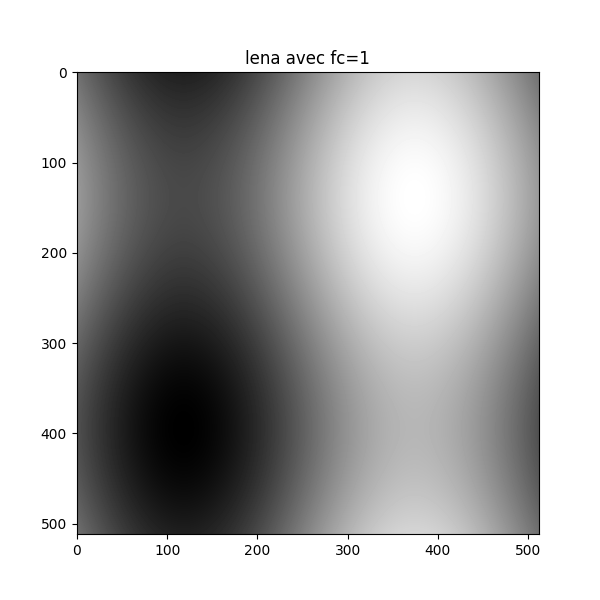

<IPython.core.display.Javascript object>


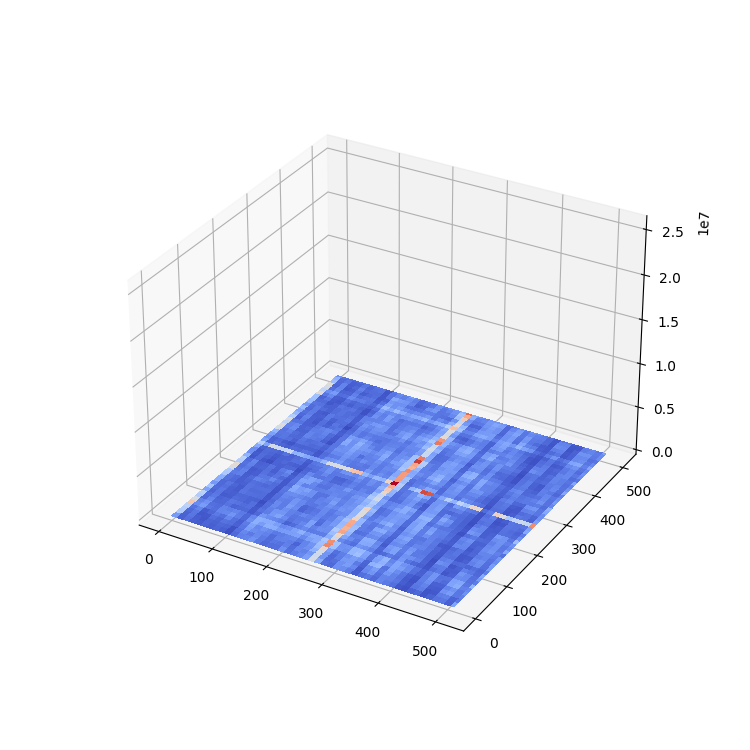

filtré avec fc=50


<IPython.core.display.Javascript object>


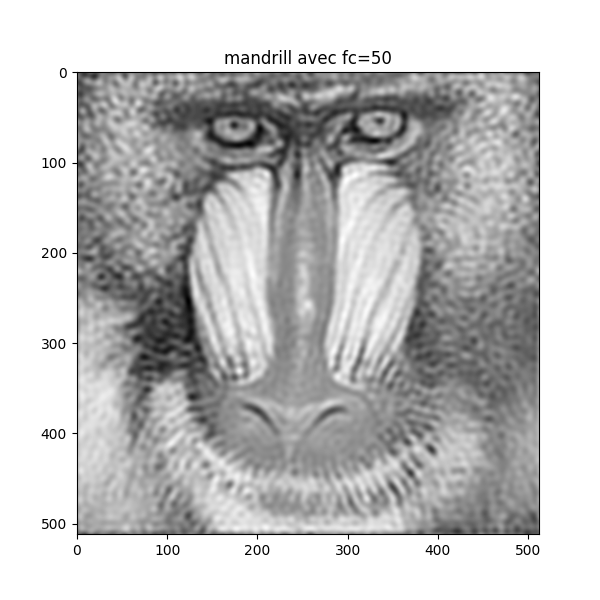

<IPython.core.display.Javascript object>


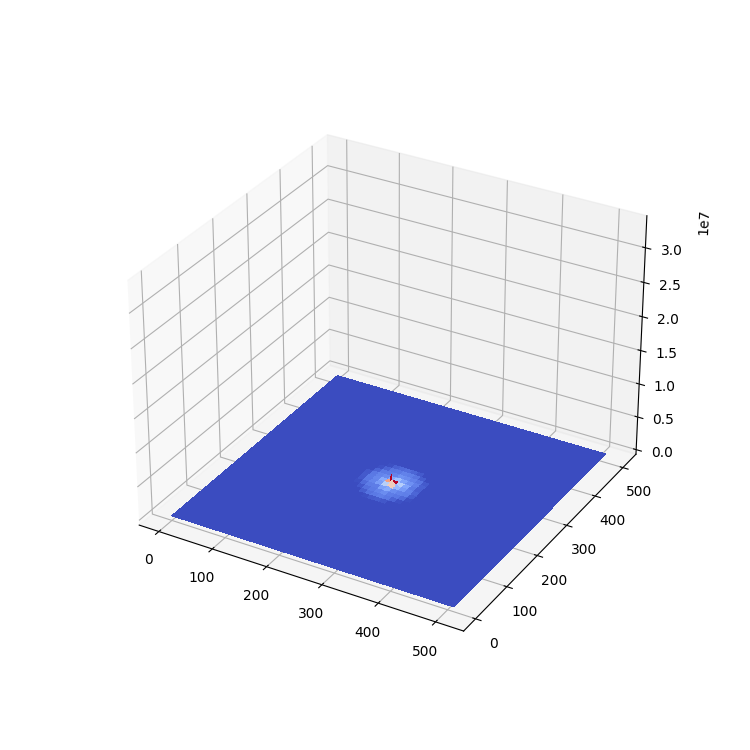

<IPython.core.display.Javascript object>


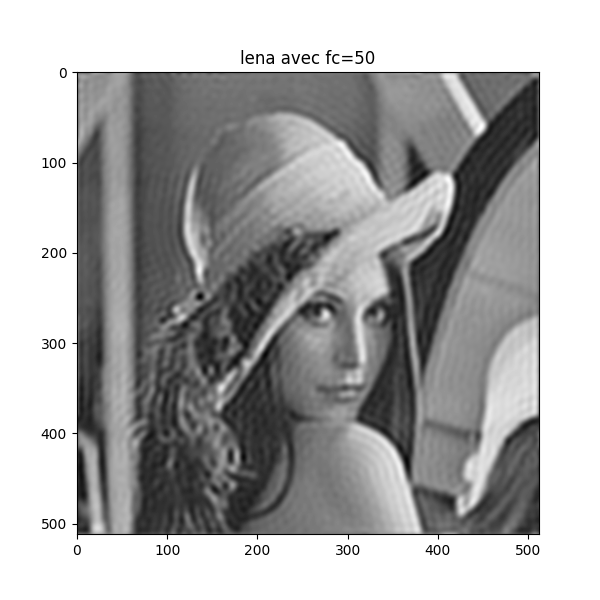

<IPython.core.display.Javascript object>


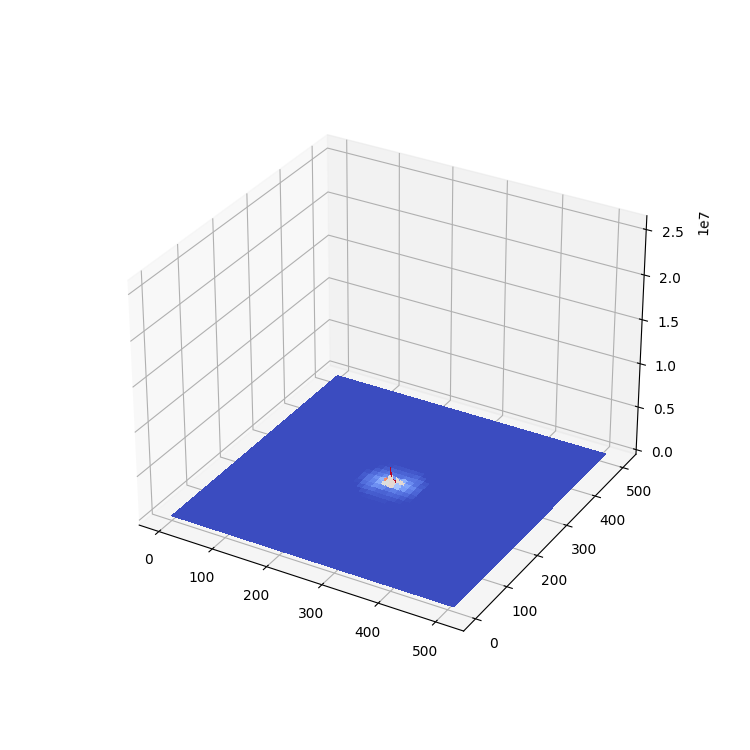

filtré avec fc=100


<IPython.core.display.Javascript object>


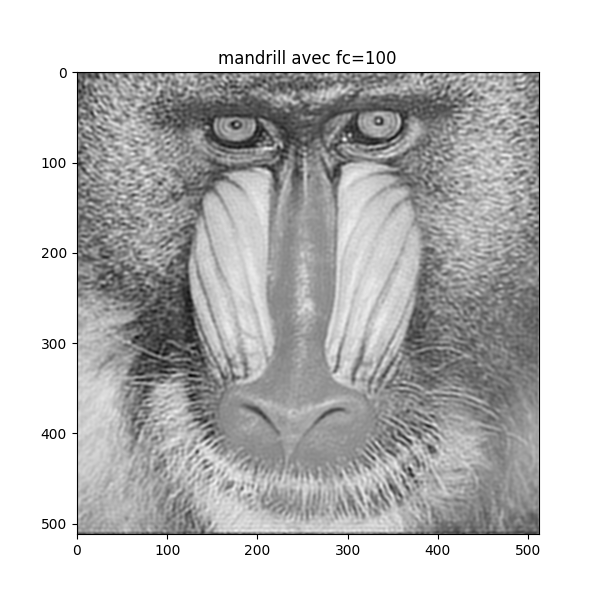

<IPython.core.display.Javascript object>


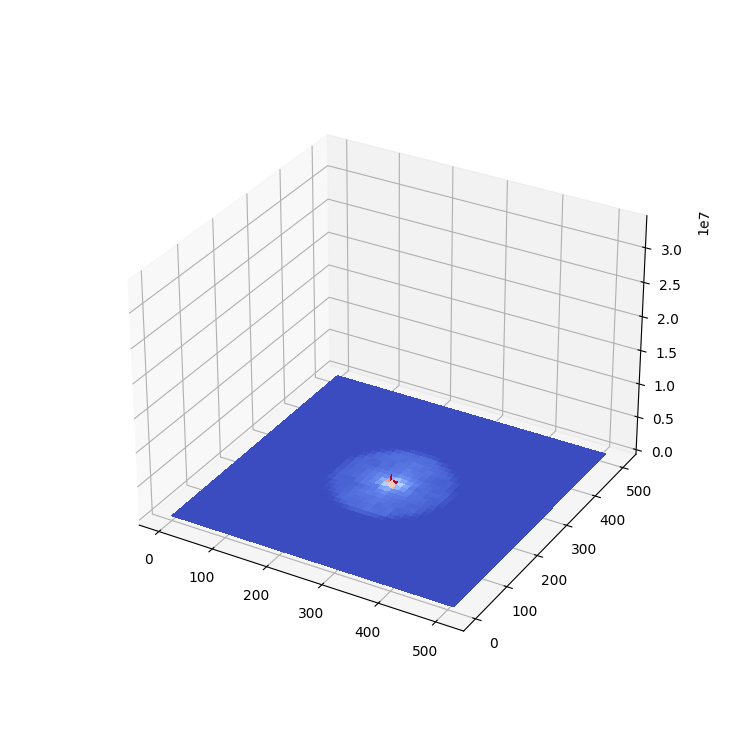

<IPython.core.display.Javascript object>


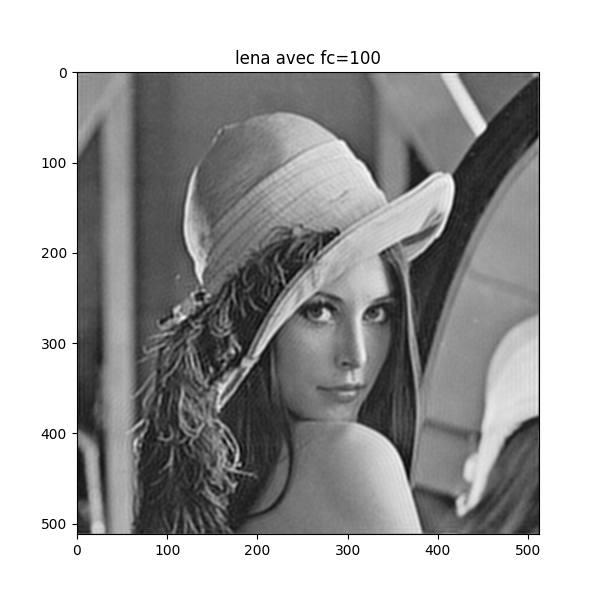

<IPython.core.display.Javascript object>


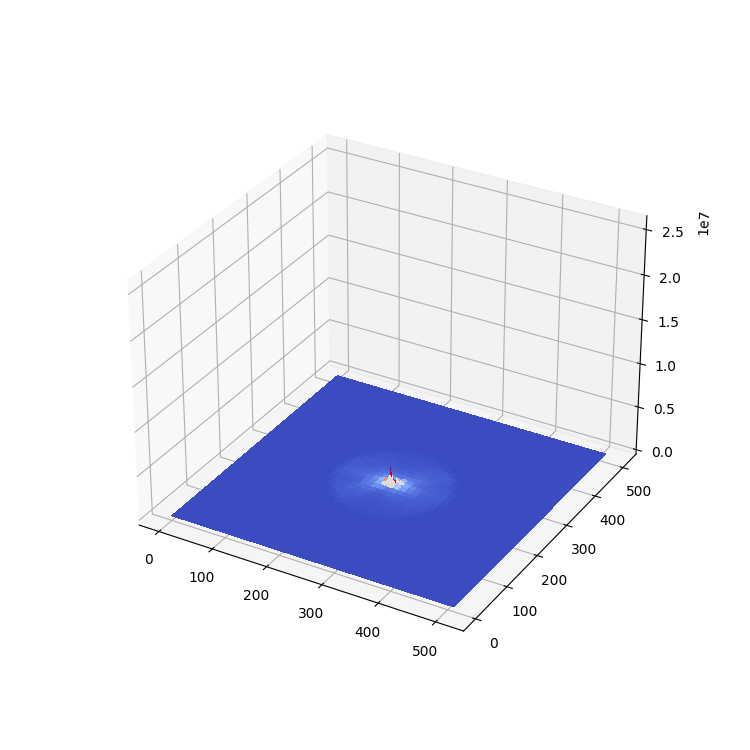

In [7]:
img = np.array(img)
img2 = Image.open("img/lena.jpg")

print("images de base")
imshow(img,"mandrill")
imshow(img2,"lena")

print("filtré avec fc=1")
imgL = lowPass(img,1) 
img2L = lowPass(img2,1) 
imshow(imgL,"mandrill avec fc=1")
surf(np.abs(fftshift(fft2(imgL))),"spectre mandrill avec fc=1")
imshow(img2L,"lena avec fc=1")
surf(np.abs(fftshift(fft2(img2L))),"spectre lena avec fc=1")

print("filtré avec fc=50")
imgL = lowPass(img,50) 
img2L = lowPass(img2,50) 
imshow(imgL,"mandrill avec fc=50")
surf(np.abs(fftshift(fft2(imgL))),"spectre mandrill avec fc=50")
imshow(img2L,"lena avec fc=50")
surf(np.abs(fftshift(fft2(img2L))),"spectre lena avec fc=50")

print("filtré avec fc=100")
imgL = lowPass(img,100) 
img2L = lowPass(img2,100) 
imshow(imgL,"mandrill avec fc=100")
surf(np.abs(fftshift(fft2(imgL))),"mandrill avec fc=100")
imshow(img2L,"lena avec fc=100")
surf(np.abs(fftshift(fft2(img2L))),"lena avec fc=100")




Quand $f_c$ reduit, on observe une perte des détails dans l'image, l'image devient "lisse", les structures dans l'image sont gardé mais les contours de ceux-ci deviennent flous.  
Les hautes frequences sont perdus dans le spectre des frequences, on conserve les basses frequences et la frequence fondamentale.  
Ce filtre peut permettre de réduire le bruit qui correspond normalement à des hautes frequences et comme je l'ai dit precedemment elle permet aussi de rendre l'image plus lisse.

## Exercice 2 -  Linear filtering (convolution)

1. Given a kernel convolution of size $d\times d$, $d$ being odd. How many lines and columns should be added to each side of the image to apply this filter? The image is supposed surrounded by zero values.

$Int^-(d/2)$

2. Write a function `imagePad(I,h)` getting an image and a kernel, returning a new image padded with zeros according to question 1. It is not allowed to use a module implementing the padding.

In [8]:
def imagePad(I,h):
   
    add = len(h)//2
    n,m = I.shape
    IP = np.zeros((n+add*2,m+add*2))
    IP[add:n+add,add:m+add] = I
    return IP
 
    

3. Write a function `conv2(I,h)` getting an image and a kernel and returning the convolution of $I$ by $h$. The function should return an image having the same shape than $I$. It is not allowed to use a module implementing the convolution.

In [9]:
def conv2(I,h):
    add = len(h)//2
    n,m = I.shape
    
    IP = imagePad(I,h)
    I2 = np.zeros((n,m))
    for x in range(add,n+add):
        for y in range(add,m+add):
            # je ne sais pas s'il faut ajouter (1/(len(h)**2)) car cette multiplication n'est vrai que pour le filtre moyennant
            I2[x-add][y-add] = np.sum(IP[x-add:x+add+1,y-add:y+add+1] * h.T) 
    return I2
    

4. Try this function on mean filter of size $3\times3$, $5\times 5$ and $7\times 7$. Discuss the results.

In [10]:
t3 = np.ones((3,3))/(3*3)
t5 = np.ones((5,5))/(5*5)
t7 = np.ones((7,7))/(7*7)

imgt3 = conv2(img,t3)
imgt5 = conv2(img,t5)
imgt7 = conv2(img,t7)

print("base")
print(img[:10,:10])
print("filtre taille 3x3")
print(imgt3[:10,:10])
print("filtre taille 5x5")
print(imgt5[:10,:10])
print("filtre taille 10x10")
print(imgt7[:10,:10])

base
[[145  55  48  88 137  90  61  33  70  76]
 [116 101  39  67  90  54  65  45  92  60]
 [ 76 114  46  46  97  59  59  47 108 106]
 [ 70 135  95  48  82 120  53  46  71  91]
 [ 86 121 131  49  76  87  74  50  55 117]
 [ 81  75 158  60  72  95  43  46  73  97]
 [ 43  51 133 129  70 122  53  61  64 110]
 [ 33  51 111 153  86 119  48  58  99 162]
 [ 57  48  55 116 146 128  59  34  65 132]
 [ 37  31  48  64 145  79  94  59  49 155]]
filtre taille 3x3
[[ 46.33333333  56.          44.22222222  52.11111111  58.44444444
   55.22222222  38.66666667  40.66666667  41.77777778  50.        ]
 [ 67.44444444  82.22222222  67.11111111  73.11111111  80.88888889
   79.11111111  57.          64.44444444  70.77777778  79.33333333]
 [ 68.          88.          76.77777778  67.77777778  73.66666667
   75.44444444  60.88888889  65.11111111  74.          77.11111111]
 [ 66.88888889  97.11111111  87.22222222  74.44444444  73.77777778
   78.55555556  66.11111111  62.55555556  76.77777778  86.        ]
 [ 63.

on observe que les chaques pixels correspond à la moyenne des pixels alentours.  
Les pixels sur les bords on souvent une valeur bien plus faible à cause du padding qui moyenne avec des 0.

5. Display the transfert function of these mean filters. For a better visualization, use the zero-padding technique to obtain a filter with a large size (for instance $256\times 256$). Use `imshow()` and `toVisualizeLogFT()`.

<IPython.core.display.Javascript object>


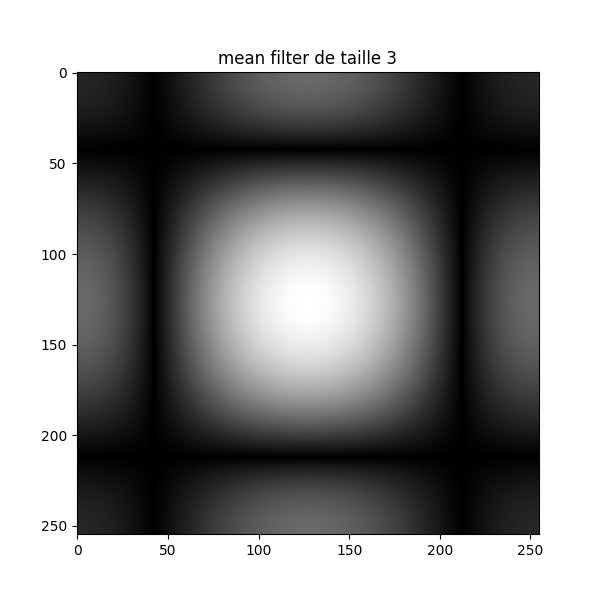

<IPython.core.display.Javascript object>


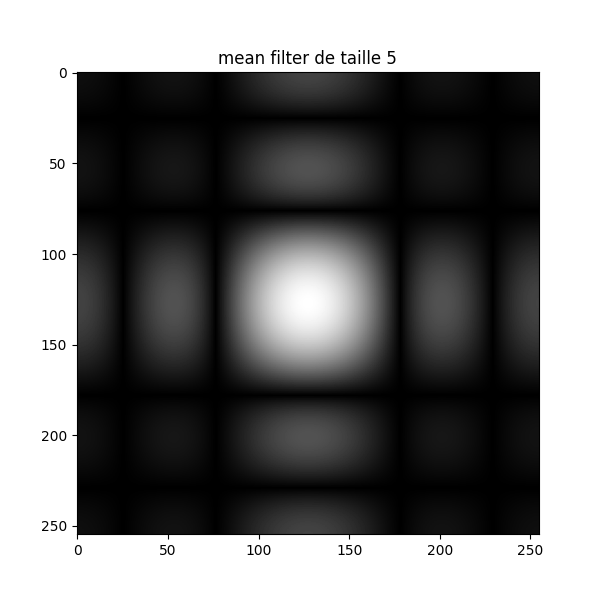

<IPython.core.display.Javascript object>


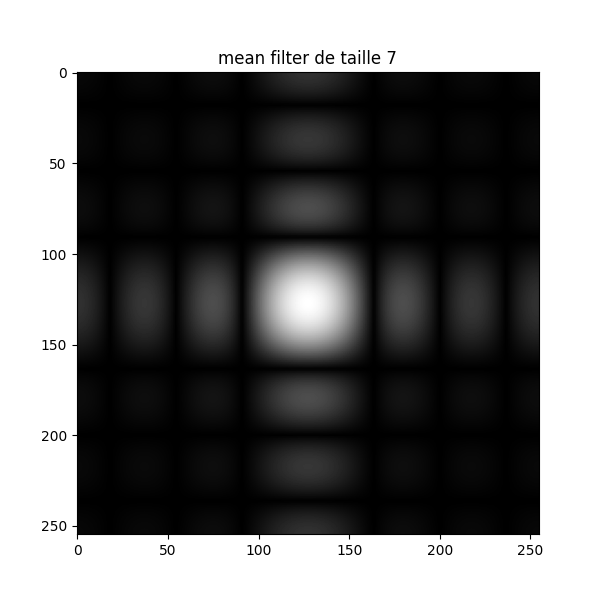

In [18]:
def toVisualizeFT(If):
    return fftshift(If)

def toVisualizeLogFT(If):
    return toVisualizeFT( np.log(np.abs(If)+1))


add = (256-3)//2
n,m = 3,3
IP = np.zeros((n+add*2,m+add*2))
IP[add:n+add,add:m+add] = t3
spectre = fft2(IP)
spectre = toVisualizeLogFT(spectre)
imshow(spectre,"mean filter de taille 3")


add = (256-5)//2
n,m = 5,5
IP = np.zeros((n+add*2,m+add*2))
IP[add:n+add,add:m+add] = t5
spectre = fft2(IP)
imshow(toVisualizeLogFT(spectre),"mean filter de taille 5")

add = (256-7)//2
n,m = 7,7
IP = np.zeros((n+add*2,m+add*2))
IP[add:n+add,add:m+add] = t7
spectre = fft2(IP)
imshow(toVisualizeLogFT(spectre),"mean filter de taille 7")

6. Interpretation: what is the analytic expression of the transfert function of a mean filter? Is  it an ideal low pass filter?

$X(u,v)=\sum_{n=0}^{N-1}\sum_{n=0}^{M-1}x(n,m)e^{-2\pi i(\frac{un}{N}+\frac{vm}{M})}$  
Pour un filtre de largeur k:  
$X(u,v)=\sum_{n=0}^{k-1}\sum_{n=0}^{k-1}x(n,m)e^{-2\pi i(\frac{un}{k}+\frac{vm}{k})}$  
$X(u,v)=\sum_{n=0}^{k-1}\sum_{n=0}^{k-1}\frac{1}{k^2}e^{-2\pi i(\frac{un+vm}{k})}$  
$X(u,v)=\frac{k^2}{k^2}\sum_{n=0}^{k-1}\sum_{n=0}^{k-1}e^{-2\pi i(\frac{un+vm}{k})}$  
$X(u,v)=\sum_{n=0}^{k-1}\sum_{n=0}^{k-1}e^{-2\pi i(\frac{un+vm}{k})}$  
Par exemple $X(0,0)=1$ pour tout mean filter  
  
Ce n'est pas un ideal low pass filter mais un filtre low pass qui est très proche de celui-ci.


7. Bonus question: perform the same study for the Gaussian kernel. Determine $\sigma$ in order to have filter of size $3\times3$, $5\times5$, and $7\times7$.

La transformation de fourrier d'une gaussienne est une gaussienne.  

Pour un filtre de sigma $\sigma$:  
$X(u,v)=e^{-2\pi^2(u^2+v^2)\sigma^2}$  
  
Trouver le $\sigma$ des filtres.  
$largeur = 2Int^+(3\sigma) + 1$  
$\sigma = (largeur - 1)/6$ (environ)  
3x3  
$\sigma = (3-1)/6 = 1/3$  
5x5  
$\sigma = (5-1)/6 = 2/3$  
7x7  
$\sigma = (7-1)/6 = 1$  
Le filtre ressemble à un ideal low-pass filter mais celui-ci a une pente moins forte qu'un ideal low pass filter, celui-ci reste un tres bon filtre low pass. 

<IPython.core.display.Javascript object>


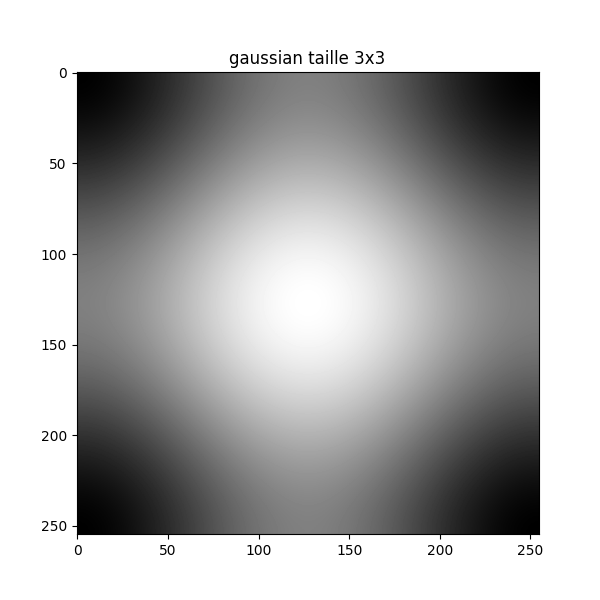

<IPython.core.display.Javascript object>


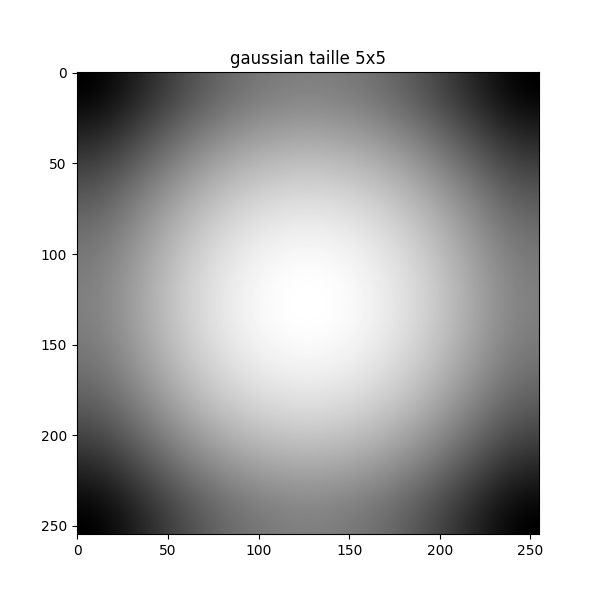

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


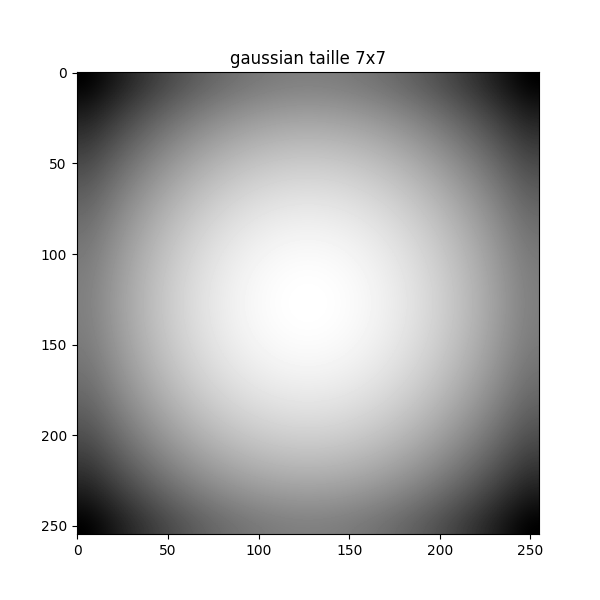

In [12]:
def gaussianKernel(sigma):
    """ double -> Array
        return a gaussian kernel of standard deviation sigma
    """
    n2 = np.int(3*sigma)
    x,y = np.meshgrid(np.arange(-n2,n2+1),np.arange(-n2,n2+1))
    kern = np.exp(-(x**2+y**2)/(2*sigma*sigma))
    return  kern/kern.sum()
### your answer start below
t3_g = gaussianKernel(1/3)
t5_g = gaussianKernel(2/3)
t7_g = gaussianKernel(1)

add = (256-3)//2
n,m = 3,3
IP = np.zeros((n+add*2,m+add*2))
IP[add:n+add,add:m+add] = t3_g
spectre = fft2(IP)
imshow(toVisualizeLogFT(spectre),"gaussian taille 3x3")

add = (256-5)//2
n,m = 5,5
IP = np.zeros((n+add*2,m+add*2))
IP[add:n+add,add:m+add] = t5_g
spectre = fft2(IP)
imshow(toVisualizeLogFT(spectre),"gaussian taille 5x5")

add = (256-7)//2
n,m = 7,7
IP = np.zeros((n+add*2,m+add*2))
IP[add:n+add,add:m+add] = t7_g
spectre = fft2(IP)
imshow(toVisualizeLogFT(spectre),"gaussian taille 7x7");

## Exercice 3: anti aliasing filtering

1. Give a code that subsamples of factor 2 (use function `subSample2()` given in TME3) the image `img/barbara.png`.

<IPython.core.display.Javascript object>


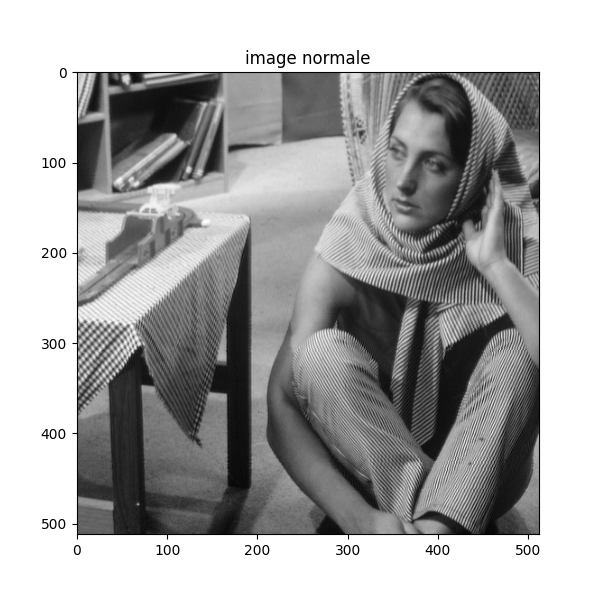

<IPython.core.display.Javascript object>


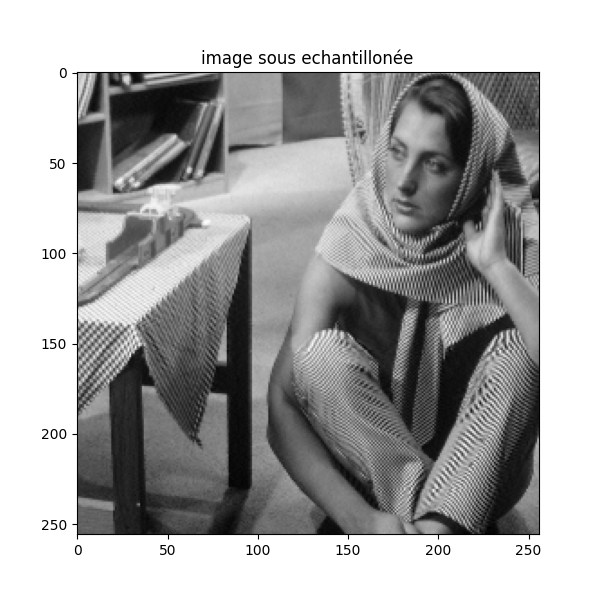

In [13]:
def subSample2(I):
    I = np.array(I)
    return I[::2,::2]

img3 = Image.open("img/barbara.png")
sample = subSample2(img3)
imshow(img3,"image normale")
imshow(sample,"image sous echantillonée")

2. Give a code that subsamples of factor 2 (use function `subSample2()`) the image `img/barbara.png` after applying an low pass filter (use `antiAliasingFilter()`). As comment, recall the principle of filtering in the frequency domain.

Dans le domaine de frequence, le filtrage correspond à une multiplication element par element de la transformation de fourrier du filtre et du spectre de fréquence.

<IPython.core.display.Javascript object>


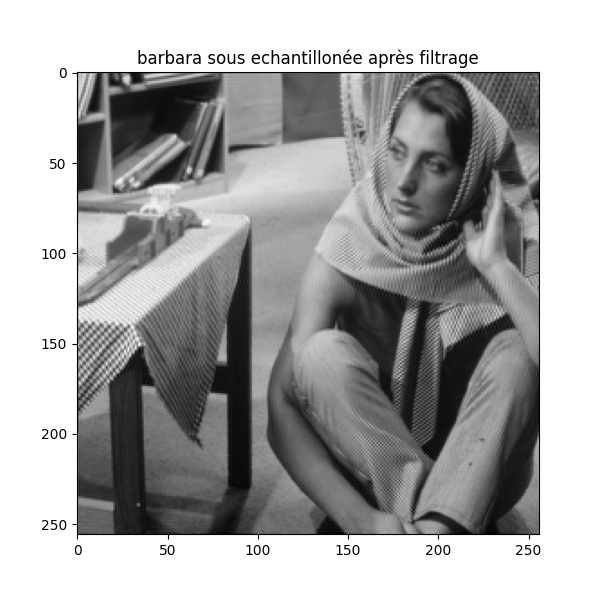

In [14]:
def antiAliasingFilter(n,m):
    """ int*int -> Array """
    n2, m2 = n//2, m//2
    rn, rm = n//4, m//4
    A = np.zeros((n, m))
    A[rn:rn+n2, rm:rm+m2] = 1
    return A
### your answer start below

# Dans le domaine de frequence, le filtrage correspond à une multiplication element par element de la transformation de fourrier du filtre et du spectre de fréquence.

def FrequenceFilter(I,f):
    
    FT = fftshift(fft2(I))
    #on ne fait pas la transformation de fourrier du filtre car il a l'air de directement s'appliquer au spectre (sinon l'image est tres flou)
    #et il n'y a aucunes indications dans le sujet
    FT = FT * f(FT.shape[0],FT.shape[1]) 
    I2 = ifft2(ifftshift(FT))
    return np.real(I2)

ss2 = subSample2(FrequenceFilter(img3,antiAliasingFilter))
imshow(ss2,"barbara sous echantillonée après filtrage")

3. Describe and analyze the filtering of Barbara with and without the anti aliasing filter. What information is lost for the two filtered images ?

On observe sur la première image, un alliasing très fort.  
Sur la seconde image, l'alliasing est beaucoup plus faible (même peut-etre inexistant) du au filtrage des hautes frequences qui modifie la frequence maximal, donc d'apres le theoreme de Shannon, l'alliasing arrive avec une frequence d'echantillonage plus faible.  
Pour la première, les pertes sont du à l'alliasing.  
Dans la seconde, on perd les hautes frequences.

## Exercice 4: color image
1. Read images `img/clown.bmp` and `img/clown_lumi.bmp` as two arrays named $I_1$ and $I_2$. Display these images examine their shape. What difference there are between them?

La première image est en couleur, son tableau de pixels contient pour chaque pixel un tableau de 3 valeurs (R,G,B).  
Ce n'est pas le cas de la seconde image qui est juste un tableau de pixels contenant les niveaux de gris.

clown.bmp
[[[122  26  40]
  [127  65  74]
  [124  31  52]
  ...
  [166  42  43]
  [169  66  54]
  [168  98 102]]

 [[124  33  42]
  [130  65  77]
  [127  39  61]
  ...
  [168  50  47]
  [167  65  59]
  [168  97  97]]

 [[126  38  46]
  [125  68  80]
  [123  43  59]
  ...
  [169  61  33]
  [172  66  54]
  [169  95  99]]

 ...

 [[ 87   6  26]
  [ 88   5  14]
  [ 83   8  31]
  ...
  [199 183 149]
  [202 184 151]
  [204 184 149]]

 [[ 86   7  29]
  [ 86   3  21]
  [ 86   7  29]
  ...
  [202 185 149]
  [202 184 144]
  [204 184 144]]

 [[ 86   8  32]
  [ 88   5  23]
  [ 89   7  27]
  ...
  [202 184 147]
  [200 181 145]
  [201 183 143]]]
(512, 512, 3)


<IPython.core.display.Javascript object>


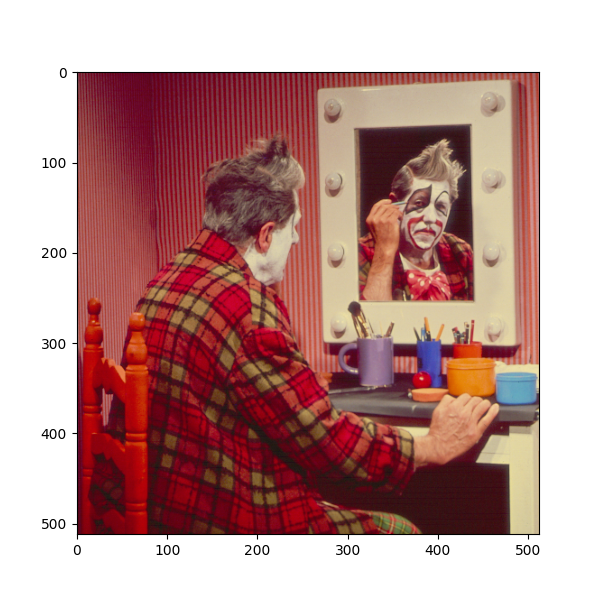

clown_lumi.bmp
[[ 67  84  70 ...  89 100 119]
 [ 70  86  74 ...  93  99 118]
 [ 73  86  74 ...  96 101 117]
 ...
 [ 46  46  45 ... 183 185 184]
 [ 45  46  46 ... 186 184 184]
 [ 46  46  48 ... 184 182 182]]
(512, 512)


<IPython.core.display.Javascript object>


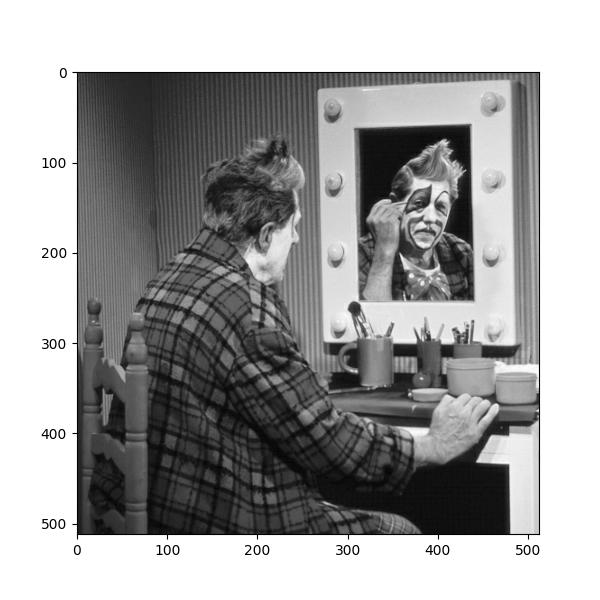

In [15]:
I_1 = np.array(Image.open("img/clown.bmp"))
I_2 = np.array(Image.open("img/clown_lumi.bmp"))
print("clown.bmp")
print(I_1)
print(I_1.shape)
imshow(I_1)
print("clown_lumi.bmp")
print(I_2)
print(I_2.shape)
imshow(I_2)


2. The first image is an array of dimension 3. Explain the signification of each dimension. From this image create 3 images $I_R$, $I_G$, $I_B$ of dimension 2. Display these three images and explain what you see.

<IPython.core.display.Javascript object>


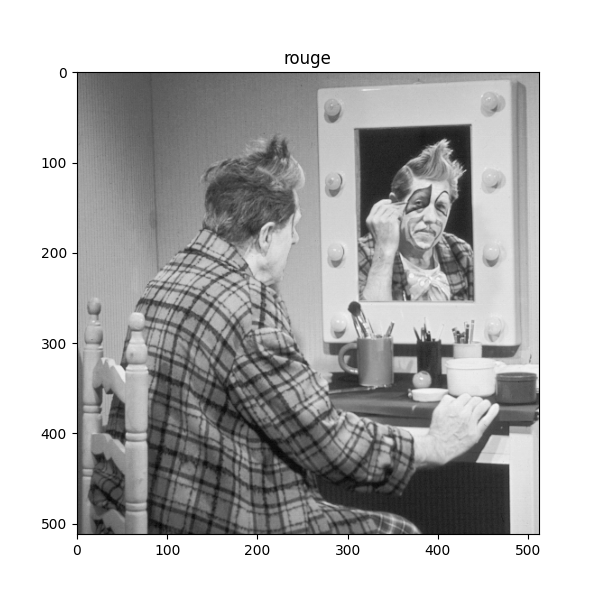

<IPython.core.display.Javascript object>


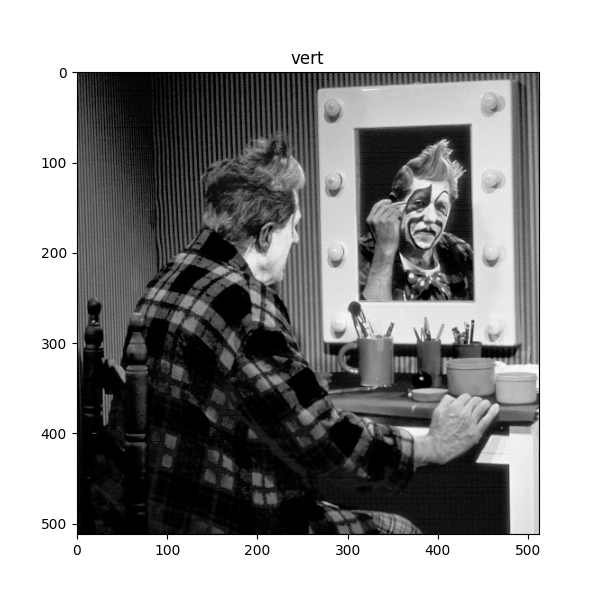

<IPython.core.display.Javascript object>


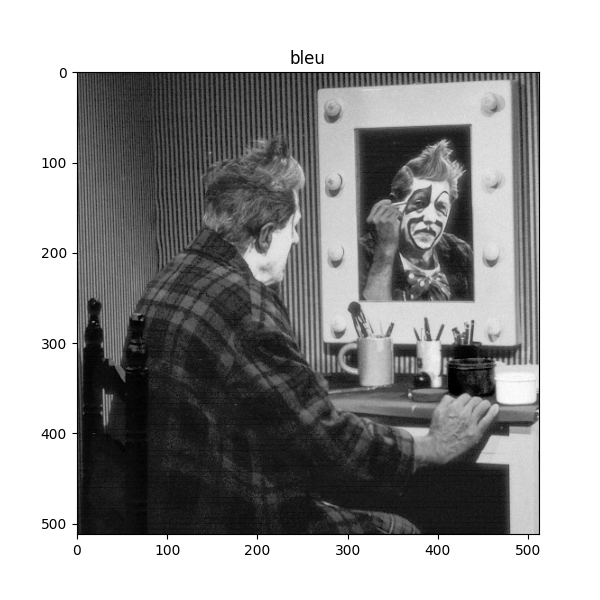

In [16]:
I_R = I_1[:,:,0]
I_G = I_1[:,:,1]
I_B = I_1[:,:,2]
imshow(I_R,"rouge")
imshow(I_G,"vert")
imshow(I_B,"bleu")


Les trois coordonnées correspondent respectivement au rouge, vert et bleu de chaque pixel.  
Pour chaque image, on observe une image en niveau de gris avec des teintes plus claires où la couleur selectionnée est présente et plus sombre sinon.

3. Create a new image $I_3$ of dimensions 3, the first dimension contains the value of $I_R$, the second the value of $I_B$ and the third the values of $I_G$. Try another combinations. Remark: color images are better handled by `imshow()` if pixel values range in $[0,1]$.

<IPython.core.display.Javascript object>


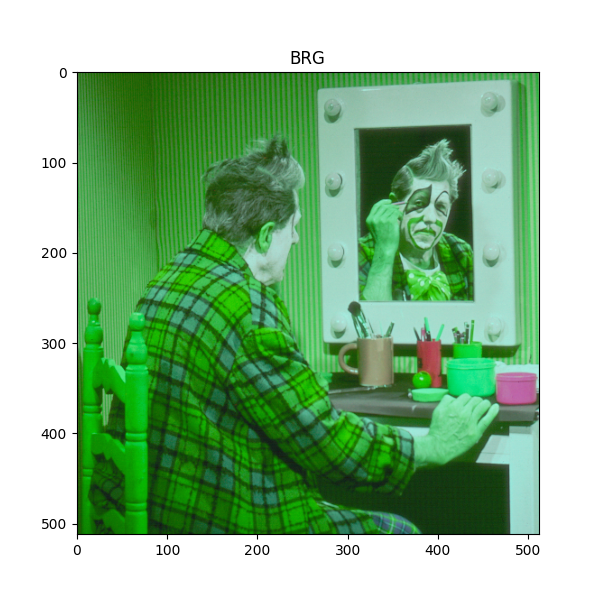

<IPython.core.display.Javascript object>


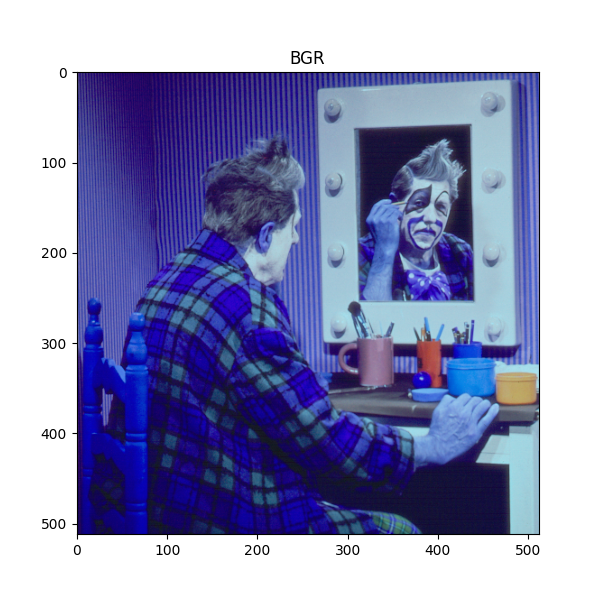

<IPython.core.display.Javascript object>


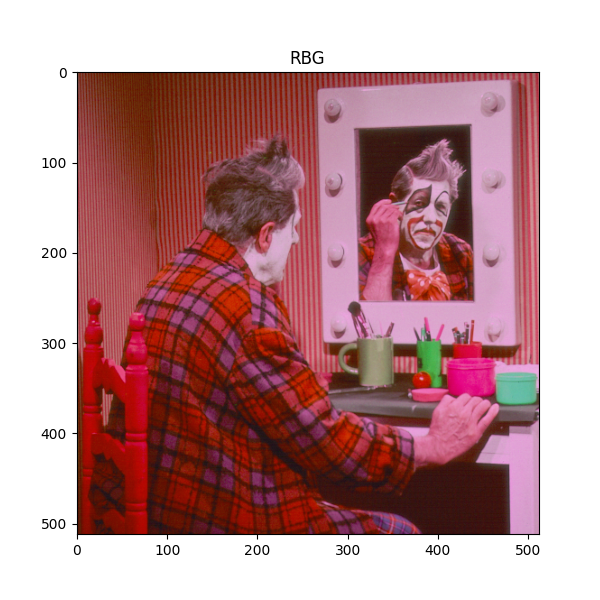

In [17]:
I_3 = np.zeros(I_1.shape)
I_3[:,:,0] = I_B
I_3[:,:,1] = I_R
I_3[:,:,2] = I_G
I_3 = I_3/255
imshow(I_3,"BRG")

I_3[:,:,0] = I_B
I_3[:,:,1] = I_G
I_3[:,:,2] = I_R
I_3 = I_3/255
imshow(I_3,"BGR")

I_3[:,:,0] = I_R
I_3[:,:,1] = I_B
I_3[:,:,2] = I_G
I_3 = I_3/255
imshow(I_3,"RBG")

4. Write a code that allows the see the first channel with red color scales, the second channel in green color scales, and the blue channel in blue color scales.

<IPython.core.display.Javascript object>


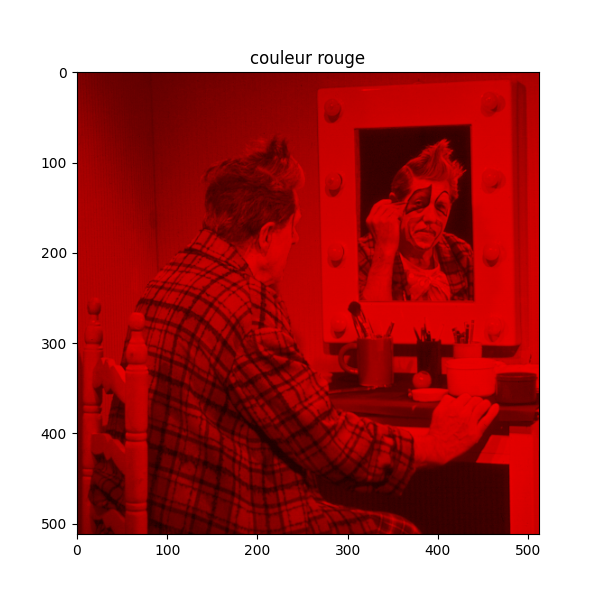

<IPython.core.display.Javascript object>


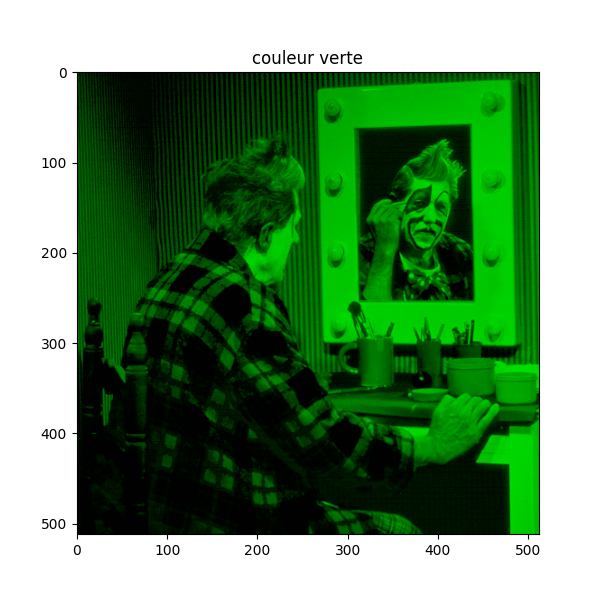

<IPython.core.display.Javascript object>


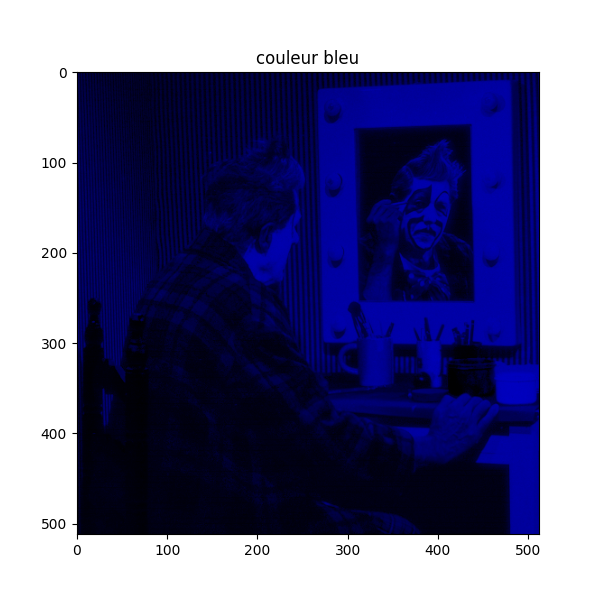

In [18]:
I_3 = np.zeros(I_1.shape)
I_3[:,:,0] = I_R
I_3[:,:,1] = 0
I_3[:,:,2] = 0
I_3 = I_3/255
imshow(I_3,"couleur rouge")

I_3 = np.zeros(I_1.shape)
I_3[:,:,0] = 0
I_3[:,:,1] = I_G
I_3[:,:,2] = 0
I_3 = I_3/255
imshow(I_3,"couleur verte")

I_3 = np.zeros(I_1.shape)
I_3[:,:,0] = 0
I_3[:,:,1] = 0
I_3[:,:,2] = I_B
I_3 = I_3/255
imshow(I_3,"couleur bleu")